In [1]:
import seml
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

/nfs/homedirs/ayle/miniconda3/envs/gr/lib/python3.8/site-packages/seml/database.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
results = seml.get_results('resnet18', to_data_frame=True)

  0%|          | 0/114 [00:00<?, ?it/s]

  0%|          | 0/114 [00:00<?, ?it/s]

/nfs/homedirs/ayle/miniconda3/envs/gr/lib/python3.8/site-packages/seml/evaluation.py:80: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  parsed = pd.io.json.json_normalize(parsed, sep='.')


In [3]:
results.columns[-328:]

Index(['result.train_acc', 'result.test_acc', 'result.sparsity',
       'result.filename', 'result.success_rate_FGSM_6',
       'result.success_rate_FGSM_12', 'result.success_rate_FGSM_24',
       'result.success_rate_FGSM_48', 'result.success_rate_L2FGSM_6',
       'result.success_rate_L2FGSM_12',
       ...
       'result.aupr_contrast_5', 'result.entropy_contrast_5',
       'result.acc_impulse_noise_4', 'result.auroc_impulse_noise_4',
       'result.aupr_impulse_noise_4', 'result.entropy_impulse_noise_4',
       'result.acc_impulse_noise_3', 'result.auroc_impulse_noise_3',
       'result.aupr_impulse_noise_3', 'result.entropy_impulse_noise_3'],
      dtype='object', length=328)

In [4]:
results = results.groupby(['config.arguments.train_scheme', 'config.arguments.prune_criterion', 'config.arguments.pruning_limit'])[
    results.columns[-328:]
].agg('mean')

In [5]:
results

result.train_acc  \
config.arguments.train_scheme config.arguments.prune_criterion config.arguments.pruning_limit                     
AdversarialTrainer            EmptyCrit                        0.00                                    0.813151   
                              GRASP                            0.50                                    0.819010   
                                                               0.70                                    0.791016   
                                                               0.80                                    0.794271   
                                                               0.90                                    0.766276   
                                                               0.95                                    0.807943   
                                                               0.98                                    0.740234   
                              IMP                              0.50                                    0.616536   
                                                               0.70                                    0.630208   
                                                               0.80                                    0.649089   
                                                               0.90                                    0.701172   
                                                               0.95                                    0.730469   
                                                               0.98                                    0.747396   
                              SNIPitDuring                     0.50                                    0.793620   
                                                               0.70                                    0.895833   
                                                               0.80                                    0.825521   
                                                               0.90                                    0.831380   
                                                               0.95                                    0.824870   
                                                               0.98                                    0.834635   
DefaultTrainer                EmptyCrit                        0.00                                    0.972656   
                              GRASP                            0.50                                    0.974609   
                                                               0.70                                    0.980469   
                                                               0.80                                    0.978516   
                                                               0.90                                    0.967448   
                                                               0.95                                    0.974609   
                                                               0.98                                    0.951823   
                              IMP                              0.50                                    0.932943   
                                                               0.70                                    0.938802   
                                                               0.80                                    0.944661   
                                                               0.90                                    0.951172   
                                                               0.95                                    0.965495   
                                                               0.98                                    0.964193   
                              SNIPitDuring                     0.50                                    0.985677   
                                                               0.70   

In [6]:
results = results.reset_index()

In [7]:
criterions = np.delete(np.unique(results["config.arguments.prune_criterion"]), np.where(np.unique(results["config.arguments.prune_criterion"]) == "EmptyCrit"))

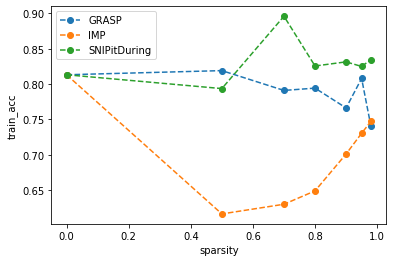

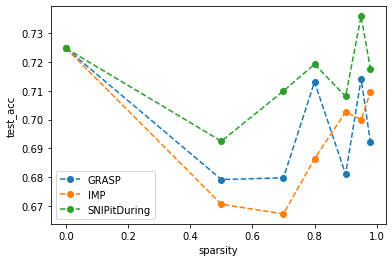

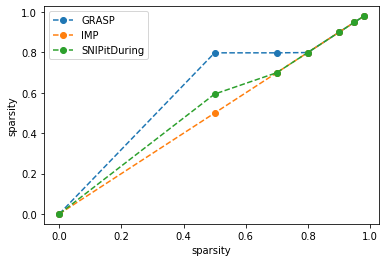

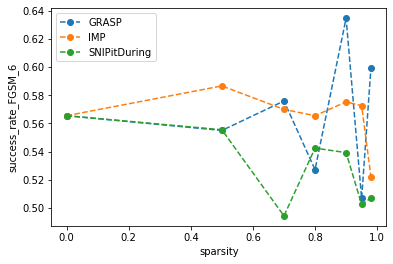

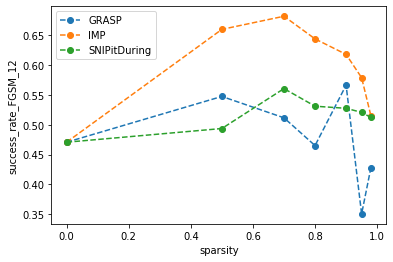

...

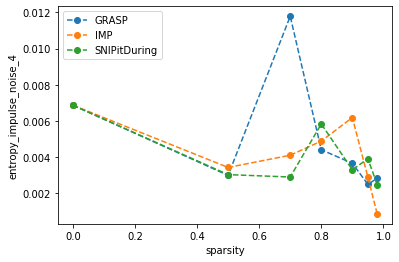

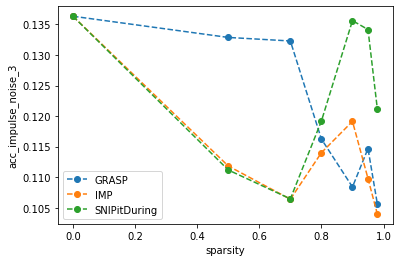

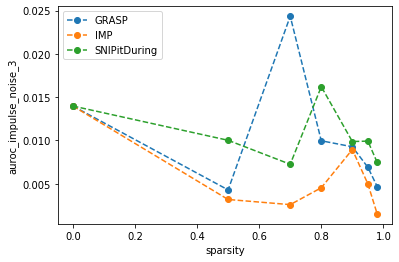

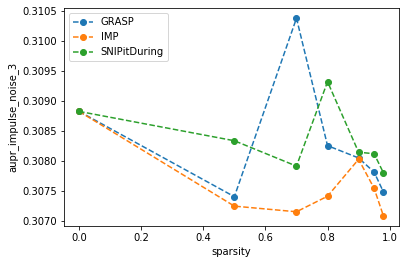

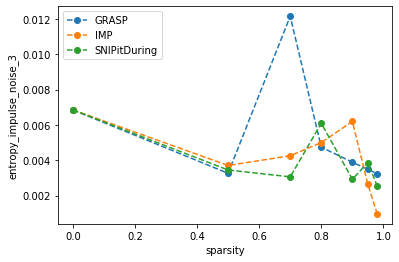

In [8]:
for col in results.columns:
    if col.startswith("result"):
        for crit in criterions:
            subset = results[(results["config.arguments.train_scheme"] == "AdversarialTrainer") &
                       ((results["config.arguments.prune_criterion"] == crit) |
                       (results["config.arguments.prune_criterion"] == "EmptyCrit"))]
            plt.plot(subset["config.arguments.pruning_limit"], subset[col], linestyle='--', marker='o', label=crit)
        plt.xlabel("sparsity")
        plt.ylabel(col.split('.')[-1])
        plt.legend()
        plt.show()